# Lab 2: Multitasking 
## IE 2250 Team 4 - Alexis Blanco, Ethan Hall, Kevin Szeto, Wyatt Faught

## Objective:
1. Evaluate User Performance while Multitasking
2. Measure & gather mixed methods data of user performance
    - Measure & gather quantitative data
    - Measure & gather qualitative data
3. Analyze & evaluate mixed methods data
4. Create graphical visualization for the data

# Import Libraries

In [226]:
#import libraries for analysis
import numpy as np
import pandas as pd
import scipy.stats as stats #statistics library

#import libraries for visualization
import matplotlib.pyplot as plt #plotting library
import seaborn as sns #import visualization library

import mitosheet #import mito package

## Load and Examine Data 

In [227]:
#df = pd.read_csv('<filename>.csv') #read in CSV file. Change as needed
df = pd.read_csv('lab2_data_S24_fix-final.csv') #read in CSV file. Change as needed
print("First Five Row of Data\n", df.head()) #print first 5 entries

First Five Row of Data
          StartDate          EndDate  Status  Progress  Duration (in seconds)  \
0  1/31/2024 15:34  1/31/2024 15:36       0       100                    174   
1  1/31/2024 15:34  1/31/2024 15:37       0       100                    176   
2  1/31/2024 15:29  1/31/2024 15:37       0       100                    456   
3  1/31/2024 15:34  1/31/2024 15:37       0       100                    204   
4  1/31/2024 15:35  1/31/2024 15:38       0       100                    212   

   Finished     RecordedDate         ResponseId DistributionChannel  \
0         1  1/31/2024 15:37  R_64I2RiYFp0Wo1SA           anonymous   
1         1  1/31/2024 15:37  R_6G0AYCVxQYfleRz           anonymous   
2         1  1/31/2024 15:37  R_7RTnsMaNmIZtGLf           anonymous   
3         1  1/31/2024 15:37  R_6pVRM5ptdefrRrJ           anonymous   
4         1  1/31/2024 15:39  R_5lsfL3AgNbDVDy9           anonymous   

  UserLanguage  ...  Gender  Task t1  Task t2  Task e1  Task e2  \
0

## Examine Data and Cleanup

In [228]:
df.drop(df.loc[:, 'StartDate':'Gender'].columns, axis=1, inplace=True) # remove columns we don't need

In [229]:
#Check for missing values
if df.isnull : # check if null values
    print('Missing Data Raw\n')
    print(df.isnull().sum()) # print number of empty cells

Missing Data Raw

Task t1            0
Task t2            0
Task e1            0
Task e2            0
Task Ratings_1     0
Task Ratings_2     0
Task Sentiment     0
block2progress    32
random             0
dtype: int64


# Task Time

## Impute Values

In [230]:
df_drop = df.loc[:, ['Task t1', 'Task t2']]
df_drop.dropna(inplace=True)
print("Drop Values\n", df_drop.describe())
print("Missing Values\n",df_drop.isna().sum())
print(df_drop)

Drop Values
           Task t1    Task t2
count   32.000000  32.000000
mean    64.881563  32.155625
std     13.565419   4.284953
min     44.270000  25.000000
25%     56.342500  28.975000
50%     64.000000  33.000000
75%     71.057500  35.237500
max    106.000000  39.960000
Missing Values
 Task t1    0
Task t2    0
dtype: int64
    Task t1  Task t2
0     74.00    38.00
1     69.00    35.00
2     59.19    34.25
3     60.92    31.40
4     54.03    35.29
5     48.00    31.00
6     56.79    33.17
7     59.23    33.63
8     48.00    26.00
9     95.00    38.00
10    69.00    34.00
11    47.00    27.00
12    55.00    35.00
13    50.00    27.00
14    61.46    29.23
15    57.51    28.21
16    71.23    35.22
17    65.00    36.00
18    53.72    29.54
19    71.00    33.00
20    44.27    26.54
21    66.00    33.00
22    65.27    29.29
23    81.88    39.96
24    63.00    25.00
25    60.00    26.00
26   106.00    36.00
27    70.00    25.00
28    75.43    32.09
29    83.00    37.00
30    71.28    31.16

In [231]:
df_mean = df.loc[:, ['Task t1', 'Task t2']]
df_mean['Task t1'].fillna(df['Task t1'].mean(), inplace = True) #use column mean to fill missing data
df_mean['Task t2'].fillna(df['Task t2'].mean(), inplace = True) #use column mean to fill missing data
print("\nMean Values\n", df_mean.describe())
print("Missing Values\n", df_mean.isna().sum())
print(df_mean)


Mean Values
           Task t1    Task t2
count   32.000000  32.000000
mean    64.881563  32.155625
std     13.565419   4.284953
min     44.270000  25.000000
25%     56.342500  28.975000
50%     64.000000  33.000000
75%     71.057500  35.237500
max    106.000000  39.960000
Missing Values
 Task t1    0
Task t2    0
dtype: int64
    Task t1  Task t2
0     74.00    38.00
1     69.00    35.00
2     59.19    34.25
3     60.92    31.40
4     54.03    35.29
5     48.00    31.00
6     56.79    33.17
7     59.23    33.63
8     48.00    26.00
9     95.00    38.00
10    69.00    34.00
11    47.00    27.00
12    55.00    35.00
13    50.00    27.00
14    61.46    29.23
15    57.51    28.21
16    71.23    35.22
17    65.00    36.00
18    53.72    29.54
19    71.00    33.00
20    44.27    26.54
21    66.00    33.00
22    65.27    29.29
23    81.88    39.96
24    63.00    25.00
25    60.00    26.00
26   106.00    36.00
27    70.00    25.00
28    75.43    32.09
29    83.00    37.00
30    71.28    31.1

## Visualize Data

Text(0, 0.5, 'Task Completion Time (seconds)')

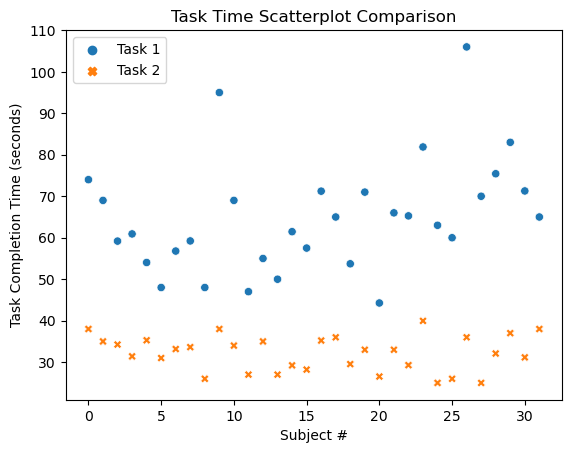

In [232]:
plt_data = df_mean.loc[:, ['Task t1', 'Task t2']]
plt_data.rename({'Task t1': 'Task 1', 'Task t2': 'Task 2'}, axis=1, inplace=True)
plot=sns.scatterplot(data=plt_data)
plot.set_title("Task Time Scatterplot Comparison")
plot.set_xlabel("Subject #")
plot.set_ylabel("Task Completion Time (seconds)")

## Show Task Time Distribution

The Histogram visually represents our data being distributed. Here, we can see that Task 2 takes significantly less time to complete compared to Task 1.

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0, 0.5, 'Count')

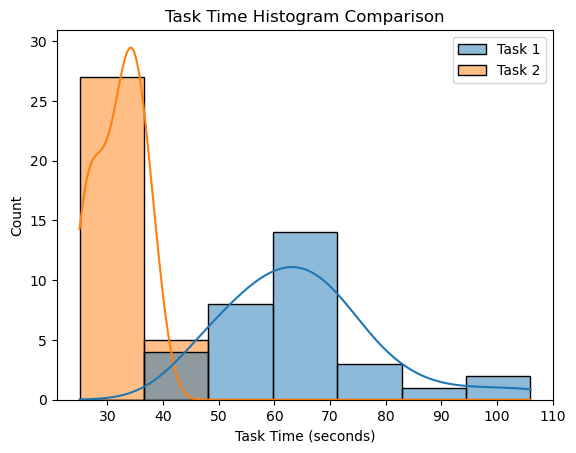

In [234]:
plot = sns.histplot(data=plt_data, kde = True) # Create task time histogram
plot.set_title("Task Time Histogram Comparison")
plot.set_xlabel("Task Time (seconds)")
plot.set_ylabel("Count")

Kernel Density Estimation (KDE) Plots are similar to Histograms but smooths them out to visualize the distribution curve better. In this case the density is the "volume" of the data.

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Task Time (seconds)')

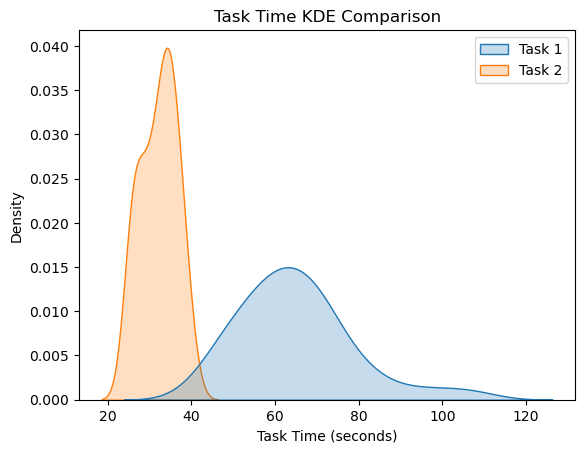

In [238]:
plot = sns.kdeplot(data=plt_data, fill=True) # # Create task time Kernal Desensity Estimation
plot.set_title("Task Time KDE Comparison")
plot.set_xlabel("Task Time (seconds)")

## Analyze and Visualize the Differences

The mean or average of the class task 1 timing is 64.88 seconds, while for task 2 this value decreased around half at 32.16 seconds. Using a data frame through Python to describe the class’s task times, we found the standard deviation according to the first and second activity; respectively, the standard deviations are 13.57 and 4.28. This shows that for the task where participants were multitasking, the results were overall less close to the mean of the class’s times. These results are consistent, as the max value of task one’s dataset is 106 seconds, and the min value came to be 44.27. The 44.27 value may seem good but when compared to the mean of the activity’s timing a huge variability is shown.

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Task Time (seconds)')

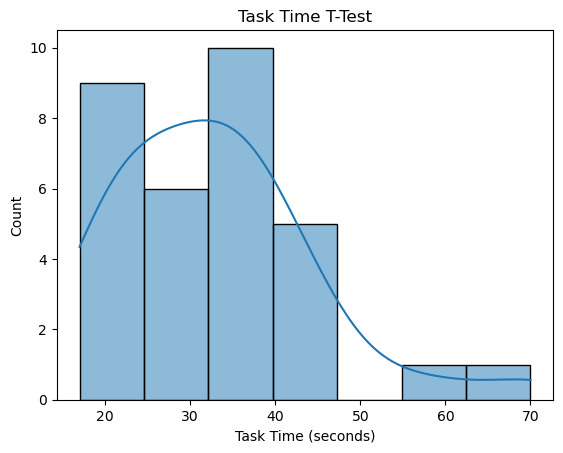

In [219]:
plt_data['Difference'] = plt_data['Task 1']- plt_data['Task 2']
plot=sns.histplot(data=plt_data['Difference'], kde = True) # Create task time difference histogram
plot.set_title("Task Time T-Test")
plot.set_xlabel("Task Time (seconds)")

## Calculate if the difference is statistically significant

We calculated the number of bins using the given equation 1+log2(n).[1] The total number of bins is 6. After finding the total number of bins, we were able to create histograms regarding the class task time for Task 1 and Task 2. In the histogram, we abeled the x-axis as the total number of bins and the y-axis as the frequency.

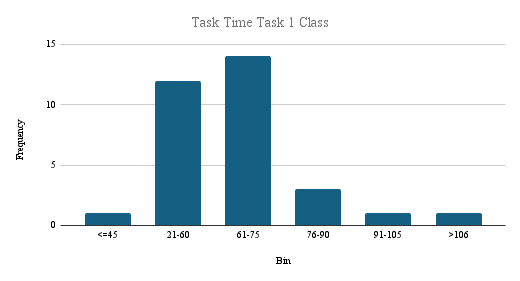

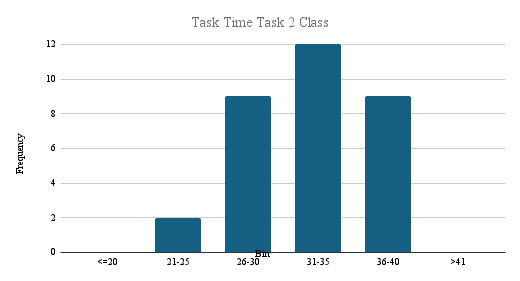

## References

[1] - Lab2_BinCalculations.xlsx 


Review in Mitosheet



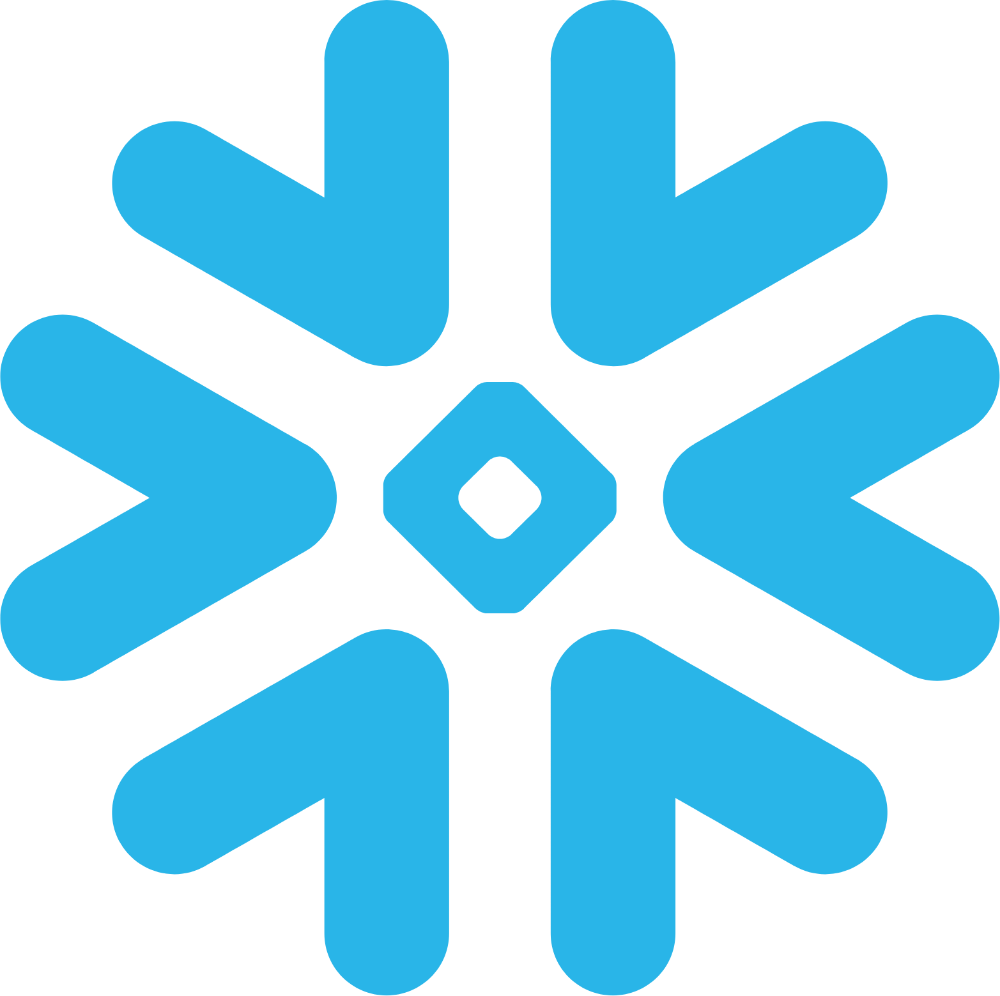

In [79]:
print("\nReview in Mitosheet")
mitosheet.sheet(plt_data, analysis_to_replay="id-zhiqbiiyho") # inspect null values in Mitosheet    

In [220]:
plt_data['Difference Squared'] = plt_data['Difference']**2

'''num = plt_data['Difference'].sum()
print("num:", num, "\n")
n = (plt_data.count())[0]
print("n: ", n, "\n")
sum_d_sq = (plt_data['Difference']**2).sum()
sum_sq = (plt_data['Difference']).sum()
sum_sq = sum_sq**2
div = (n * sum_d_sq - sum_sq) / (n-1)
t_value = num/div
print(t_value)'''

'num = plt_data[\'Difference\'].sum()\nprint("num:", num, "\n")\nn = (plt_data.count())[0]\nprint("n: ", n, "\n")\nsum_d_sq = (plt_data[\'Difference\']**2).sum()\nsum_sq = (plt_data[\'Difference\']).sum()\nsum_sq = sum_sq**2\ndiv = (n * sum_d_sq - sum_sq) / (n-1)\nt_value = num/div\nprint(t_value)'

Use scipy.stats library

In [221]:
result = stats.ttest_rel(plt_data['Task 1'], plt_data['Task 2'], alternative='greater')

#print(result)
print(f'Degrees of Fredom (dof = n-1): {result.df}')
print(f't statistic: {result.statistic:.3}')
print(f'pvalue: {result.pvalue:.3}')

Degrees of Fredom (dof = n-1): 31
t statistic: 15.9
pvalue: 8.98e-17


In this case, our significange level is 0.05. If p>0.05, we accept our null hypothesis. If p<0.05, we reject our hypothesis. Based on the data we collected and the values computed using both Python and Excel, we *reject* our hypothesis. Multitasking should be avoided.

# Task Error

## Impute Values

In [222]:
df_drop = df.loc[:, ['Task e1', 'Task e2']]
df_drop.dropna(inplace=True)
print("Drop Values\n", df_drop.describe())
print("Missing Values\n",df_drop.isna().sum())
print(df_drop)

Drop Values
          Task e1    Task e2
count  32.000000  32.000000
mean    0.906250   0.250000
std     1.088336   0.567962
min     0.000000   0.000000
25%     0.000000   0.000000
50%     1.000000   0.000000
75%     1.250000   0.000000
max     4.000000   2.000000
Missing Values
 Task e1    0
Task e2    0
dtype: int64
    Task e1  Task e2
0         3        0
1         1        1
2         1        1
3         0        0
4         2        0
5         0        0
6         0        0
7         1        0
8         0        0
9         1        0
10        3        2
11        2        0
12        0        2
13        1        0
14        1        1
15        0        0
16        2        0
17        1        0
18        0        0
19        0        0
20        0        1
21        0        0
22        2        0
23        0        0
24        0        0
25        1        0
26        1        0
27        0        0
28        4        0
29        0        0
30        2        0
31      

In [223]:
df_mean = df.loc[:, ['Task e1', 'Task e2']]
df_mean['Task e1'].fillna(df['Task e1'].mean(), inplace = True) #use column mean to fill missing data
df_mean['Task e2'].fillna(df['Task e2'].mean(), inplace = True) #use column mean to fill missing data
print("\nMean Values\n", df_mean.describe())
print("Missing Values\n", df_mean.isna().sum())
print(df_mean)


Mean Values
          Task e1    Task e2
count  32.000000  32.000000
mean    0.906250   0.250000
std     1.088336   0.567962
min     0.000000   0.000000
25%     0.000000   0.000000
50%     1.000000   0.000000
75%     1.250000   0.000000
max     4.000000   2.000000
Missing Values
 Task e1    0
Task e2    0
dtype: int64
    Task e1  Task e2
0         3        0
1         1        1
2         1        1
3         0        0
4         2        0
5         0        0
6         0        0
7         1        0
8         0        0
9         1        0
10        3        2
11        2        0
12        0        2
13        1        0
14        1        1
15        0        0
16        2        0
17        1        0
18        0        0
19        0        0
20        0        1
21        0        0
22        2        0
23        0        0
24        0        0
25        1        0
26        1        0
27        0        0
28        4        0
29        0        0
30        2        0
31     

## Visualize Data

Text(0, 0.5, '# of Errors')

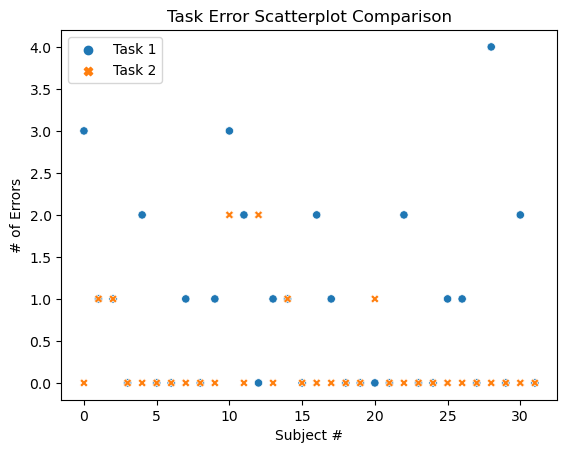

In [224]:
plt_data = df_mean.loc[:, ['Task e1', 'Task e2']]
plt_data.rename({'Task e1': 'Task 1', 'Task e2': 'Task 2'}, axis=1, inplace=True)
plot=sns.scatterplot(data=plt_data)
plot.set_title("Task Error Scatterplot Comparison")
plot.set_xlabel("Subject #")
plot.set_ylabel("# of Errors")

## Show Task Error Distribution

Based on the class data recorded from our lab, the histogram below identifies where the most amount of errors were made. Task 1 appears to have more potential errors when comapred to Task 2, which has a less likely chance at ay errors.

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0, 0.5, 'Count')

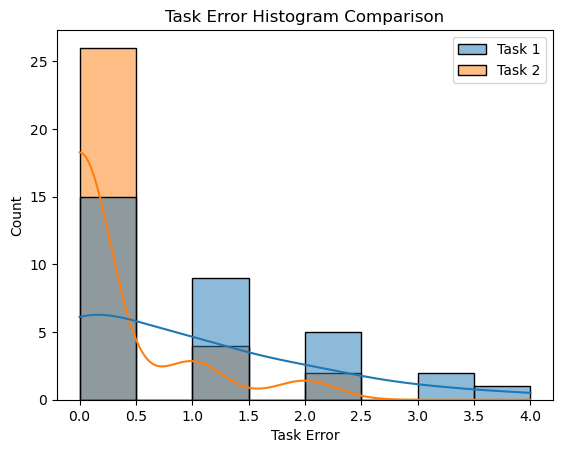

In [180]:
plot = sns.histplot(data=plt_data, kde = True) # Create task time histogram
plot.set_title("Task Error Histogram Comparison")
plot.set_xlabel("Task Error")
plot.set_ylabel("Count")

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Task Error')

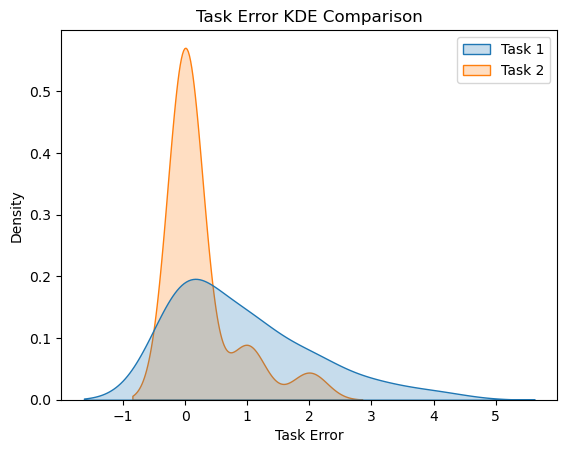

In [181]:
plot = sns.kdeplot(data=plt_data, fill=True) # # Create task time Kernal Desensity Estimation
plot.set_title("Task Error KDE Comparison")
plot.set_xlabel("Task Error")

## Analyze & Visualize Differences

In terms of error, the mean of inaccuracies for task 1 and 2 are .9062 and .2500; 1.088 and .567 are the standard deviations of each.In the task time histogram comparison chart the error in task 1 is higher throughout the task, in addition to the task taking a longer time to complete than task 2. Task 2 shows an initial rate of mistakes during the task much higher than other chronological times. Near halfway through the second task, no errors were made on average by 32 students in our class. With less errors and less time to complete the task, it is assured that focus on one task followed by the other is again proved to be more efficient.

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Task Error')

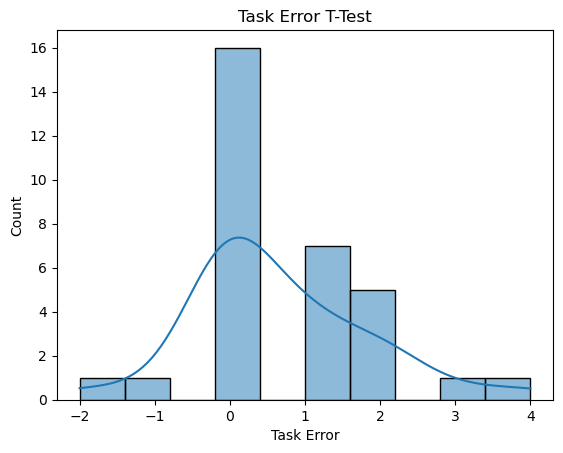

In [182]:
plt_data['Difference'] = plt_data['Task 1']- plt_data['Task 2']
plot=sns.histplot(data=plt_data['Difference'], kde = True) # Create task time difference histogram
plot.set_title("Task Error T-Test")
plot.set_xlabel("Task Error")

## Calculate if Differences are Statistically Significant

We calculated the number of bins using the given equation 1+log2(n).[1] The total number of bins is 6. After finding the total number of bins, we were able to create histograms regarding the class task time for Task 1 and Task 2. In the histogram, we abeled the x-axis as the total number of bins and the y-axis as the frequency.

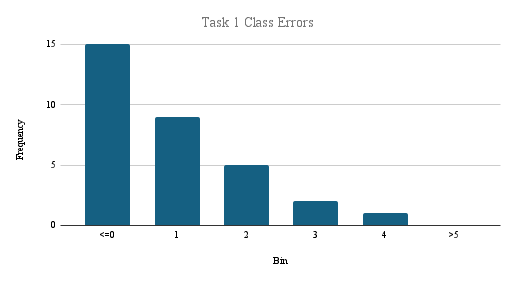

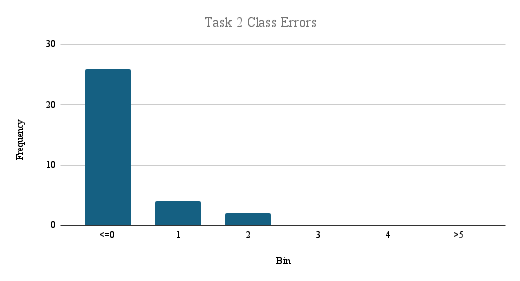

## References

[1] - Lab2_BinCalculations.xlsx 


Review in Mitosheet



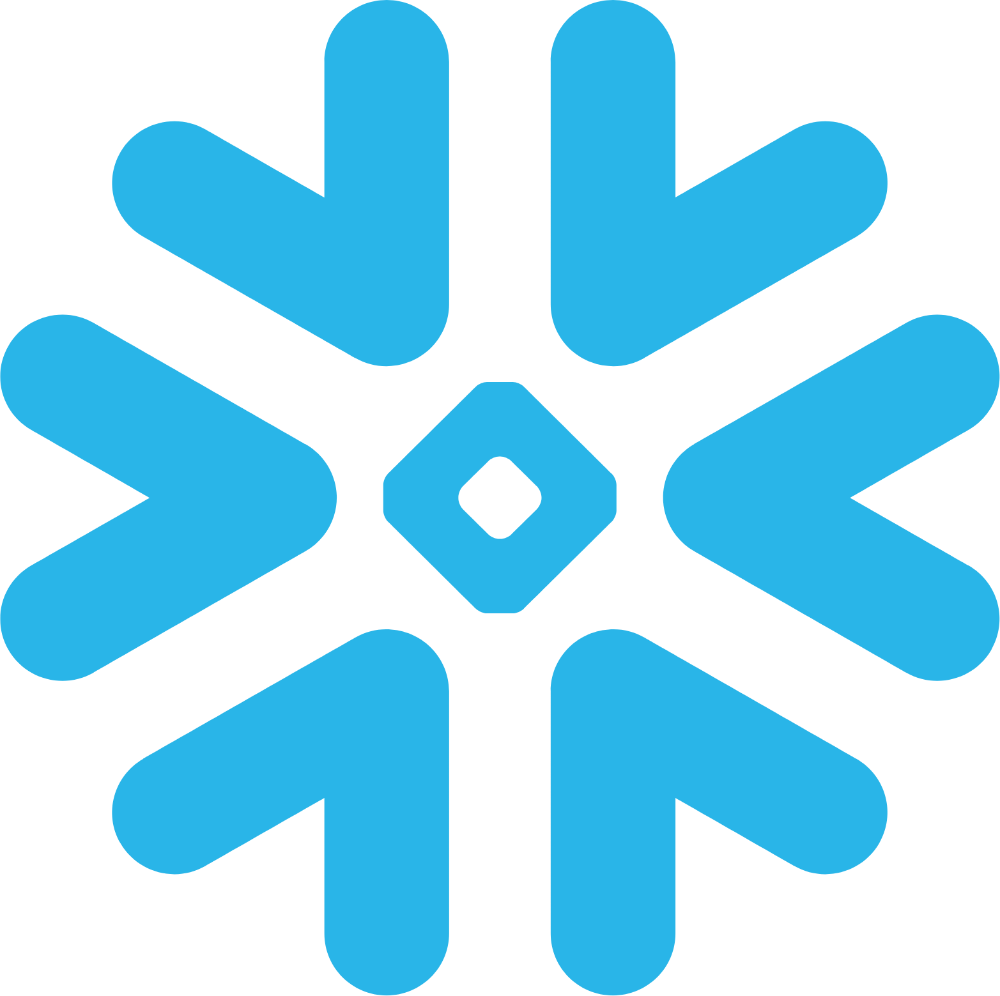

In [88]:
print("\nReview in Mitosheet")
mitosheet.sheet(plt_data, analysis_to_replay="id-zhiqbiiyho") # inspect null values in Mitosheet 

In [183]:
plt_data['Difference Squared'] = plt_data['Difference']**2

'''num = plt_data['Difference'].sum()
print("num:", num, "\n")
n = (plt_data.count())[0]
print("n: ", n, "\n")
sum_d_sq = (plt_data['Difference']**2).sum()
sum_sq = (plt_data['Difference']).sum()
sum_sq = sum_sq**2
div = (n * sum_d_sq - sum_sq) / (n-1)
t_value = num/div
print(t_value)'''

'num = plt_data[\'Difference\'].sum()\nprint("num:", num, "\n")\nn = (plt_data.count())[0]\nprint("n: ", n, "\n")\nsum_d_sq = (plt_data[\'Difference\']**2).sum()\nsum_sq = (plt_data[\'Difference\']).sum()\nsum_sq = sum_sq**2\ndiv = (n * sum_d_sq - sum_sq) / (n-1)\nt_value = num/div\nprint(t_value)'

Use scipy.stats library

In [184]:
result = stats.ttest_rel(plt_data['Task 1'], plt_data['Task 2'], alternative='greater')

#print(result)
print(f'Degrees of Fredom (dof = n-1): {result.df}')
print(f't statistic: {result.statistic:.3}')
print(f'pvalue: {result.pvalue:.3}')

Degrees of Fredom (dof = n-1): 31
t statistic: 3.14
pvalue: 0.00183


In this case, our significange level is 0.05. If p>0.05, we accept our null hypothesis. If p<0.05, we reject our hypothesis. Based on the data we collected and the values computed using both Python and Excel, we ** our hypothesis. Multitasking should be avoided.

# Task Rating

## Impute Values

In [185]:
df_drop = df.loc[:, ['Task Ratings_1', 'Task Ratings_2']]
df_drop.dropna(inplace=True)
print("Drop Values\n", df_drop.describe())
print("Missing Values\n",df_drop.isna().sum())
print(df_drop)

Drop Values
        Task Ratings_1  Task Ratings_2
count       32.000000       32.000000
mean         3.781250        1.687500
std          0.706394        0.859013
min          2.000000        1.000000
25%          3.750000        1.000000
50%          4.000000        2.000000
75%          4.000000        2.000000
max          5.000000        5.000000
Missing Values
 Task Ratings_1    0
Task Ratings_2    0
dtype: int64
    Task Ratings_1  Task Ratings_2
0                4               2
1                4               1
2                4               1
3                4               1
4                4               1
5                3               2
6                4               2
7                2               1
8                4               1
9                2               1
10               4               1
11               3               1
12               4               2
13               3               1
14               4               3
15              

In [186]:
df_mean = df.loc[:, ['Task Ratings_1', 'Task Ratings_2']]
df_mean['Task Ratings_1'].fillna(df['Task Ratings_1'].mean(), inplace = True) #use column mean to fill missing data
df_mean['Task Ratings_2'].fillna(df['Task Ratings_2'].mean(), inplace = True) #use column mean to fill missing data
print("\nMean Values\n", df_mean.describe())
print("Missing Values\n", df_mean.isna().sum())
print(df_mean)


Mean Values
        Task Ratings_1  Task Ratings_2
count       32.000000       32.000000
mean         3.781250        1.687500
std          0.706394        0.859013
min          2.000000        1.000000
25%          3.750000        1.000000
50%          4.000000        2.000000
75%          4.000000        2.000000
max          5.000000        5.000000
Missing Values
 Task Ratings_1    0
Task Ratings_2    0
dtype: int64
    Task Ratings_1  Task Ratings_2
0                4               2
1                4               1
2                4               1
3                4               1
4                4               1
5                3               2
6                4               2
7                2               1
8                4               1
9                2               1
10               4               1
11               3               1
12               4               2
13               3               1
14               4               3
15             

## Visualize Data

Text(0, 0.5, 'Task Rating')

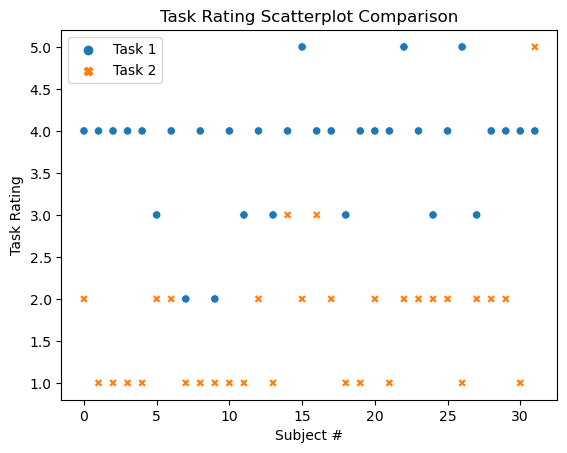

In [187]:
plt_data = df_mean.loc[:, ['Task Ratings_1', 'Task Ratings_2']]
plt_data.rename({'Task Ratings_1': 'Task 1', 'Task Ratings_2': 'Task 2'}, axis=1, inplace=True)
plot=sns.scatterplot(data=plt_data)
plot.set_title("Task Rating Scatterplot Comparison")
plot.set_xlabel("Subject #")
plot.set_ylabel("Task Rating")

## Show Task Rating Distributions

Based on the data collected during the lab, we see in our histogram that Task 1 has more ratings in terms of difficulty compared to Task 2. Task 1 boasts an average value of 4 based on the complexity of the task whereas Task 2 shows a lower value due to ease of the task.

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0, 0.5, 'Count')

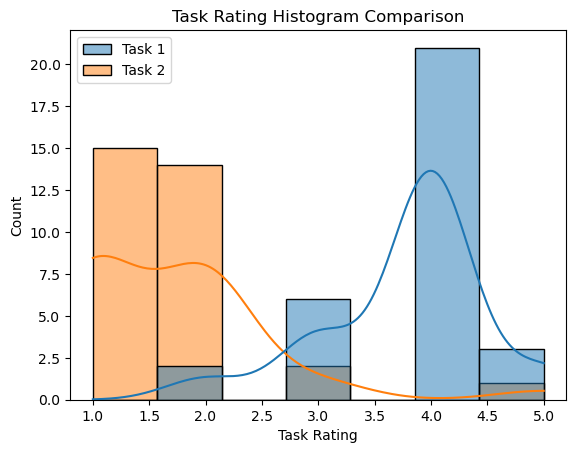

In [188]:
plot = sns.histplot(data=plt_data, kde = True) # Create task time histogram
plot.set_title("Task Rating Histogram Comparison")
plot.set_xlabel("Task Rating")
plot.set_ylabel("Count")

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Task Rating')

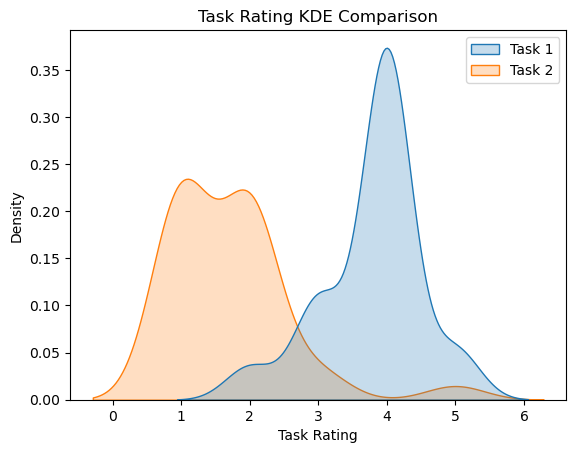

In [189]:
plot = sns.kdeplot(data=plt_data, fill=True) # # Create task time Kernal Desensity Estimation
plot.set_title("Task Rating KDE Comparison")
plot.set_xlabel("Task Rating")

## Analyze & Visualize the Differences

This contrast of the mean and maximum value from the lowest value and the results of task 2 display a lack of productivity surrounding multitasking. The minimum value of task 1 is about 3 seconds higher than the maximum value of task 2. Even the slowest participant surpassed performance when focused when set side by side with the fastest multitasker.

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Task Rating')

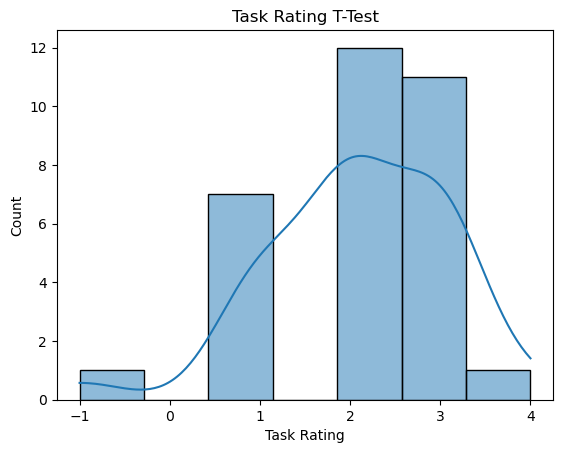

In [190]:
plt_data['Difference'] = plt_data['Task 1']- plt_data['Task 2']
plot=sns.histplot(data=plt_data['Difference'], kde = True) # Create task time difference histogram
plot.set_title("Task Rating T-Test")
plot.set_xlabel("Task Rating")

## Calculate if the Difference is Statistically Significant

We calculated the number of bins using the given equation 1+log2(n).[1] The total number of bins is 6. After finding the total number of bins, we were able to create histograms regarding the class task time for Task 1 and Task 2. In the histogram, we abeled the x-axis as the total number of bins and the y-axis as the frequency.

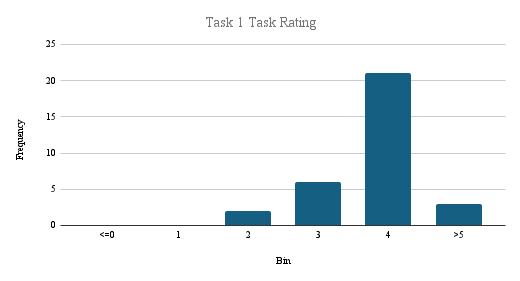

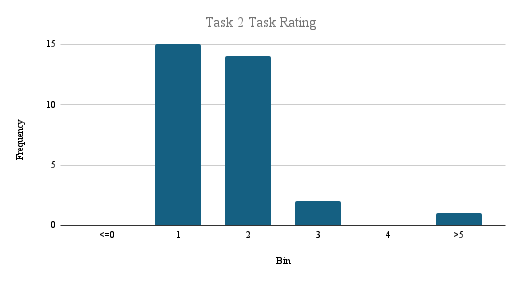

## References

[1] - Lab2_BinCalculations.xlsx 


Review in Mitosheet



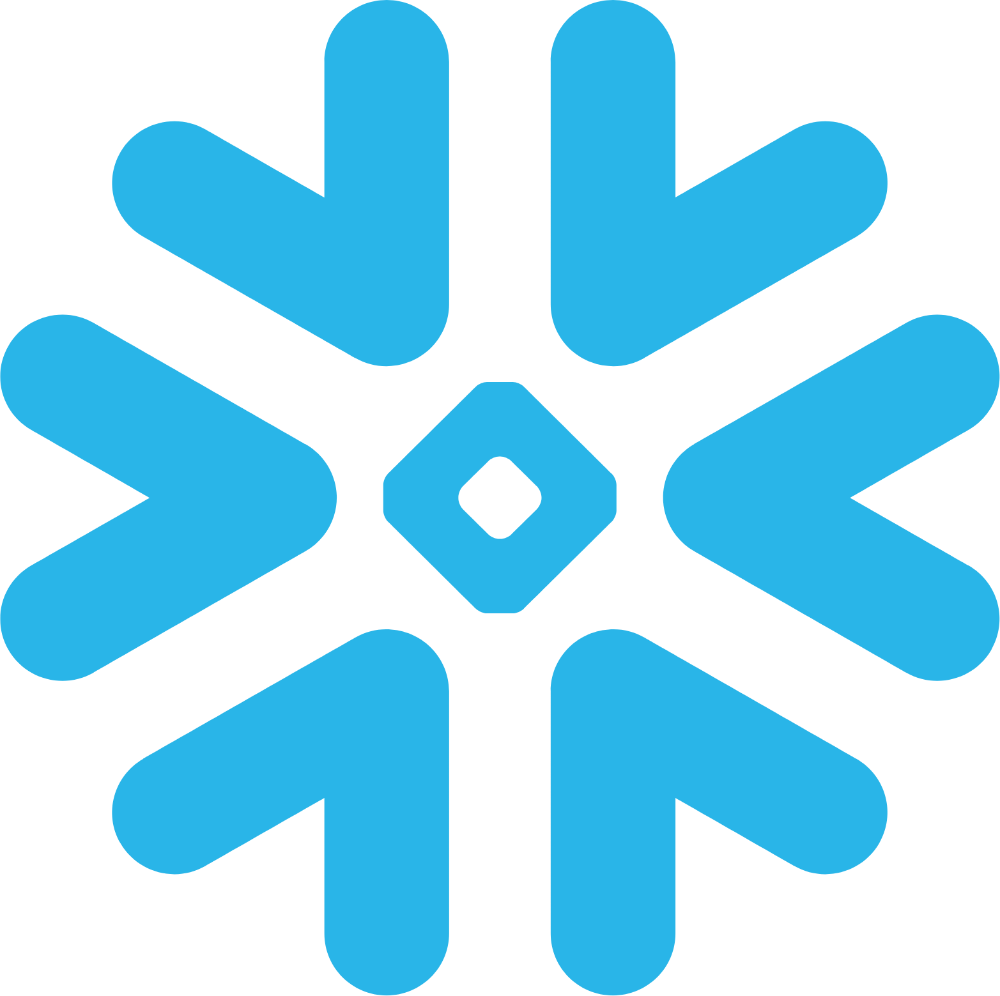

In [97]:
print("\nReview in Mitosheet")
mitosheet.sheet(plt_data, analysis_to_replay="id-zhiqbiiyho") # inspect null values in Mitosheet    

In [191]:
plt_data['Difference Squared'] = plt_data['Difference']**2

'''num = plt_data['Difference'].sum()
print("num:", num, "\n")
n = (plt_data.count())[0]
print("n: ", n, "\n")
sum_d_sq = (plt_data['Difference']**2).sum()
sum_sq = (plt_data['Difference']).sum()
sum_sq = sum_sq**2
div = (n * sum_d_sq - sum_sq) / (n-1)
t_value = num/div
print(t_value)'''

'num = plt_data[\'Difference\'].sum()\nprint("num:", num, "\n")\nn = (plt_data.count())[0]\nprint("n: ", n, "\n")\nsum_d_sq = (plt_data[\'Difference\']**2).sum()\nsum_sq = (plt_data[\'Difference\']).sum()\nsum_sq = sum_sq**2\ndiv = (n * sum_d_sq - sum_sq) / (n-1)\nt_value = num/div\nprint(t_value)'

Use scipy.stats library

In [192]:
result = stats.ttest_rel(plt_data['Task 1'], plt_data['Task 2'], alternative='greater')

#print(result)
print(f'Degrees of Fredom (dof = n-1): {result.df}')
print(f't statistic: {result.statistic:.3}')
print(f'pvalue: {result.pvalue:.3}')

Degrees of Fredom (dof = n-1): 31
t statistic: 11.9
pvalue: 2.16e-13


In this case, our significange level is 0.05. If p>0.05, we accept our null hypothesis. If p<0.05, we reject our hypothesis. Based on the data we collected and the values computed using both Python and Excel, we ** our hypothesis. Multitasking should be avoided.

# Group 4 Data

## Load & Examine Data

In [193]:
#df = pd.read_csv('<filename>.csv') #read in CSV file. Change as needed
df = pd.read_csv('lab2_GroupData-final.csv') #read in CSV file. Change as needed
print("First Five Row of Data\n", df.head()) #print first 5 entries

First Five Row of Data
          StartDate          EndDate  Status  Progress  Duration (in seconds)  \
0  1/31/2024 15:46  1/31/2024 15:48       0       100                    122   
1  1/31/2024 15:48  1/31/2024 15:49       0       100                     97   
2  1/31/2024 15:48  1/31/2024 15:49       0       100                     84   
3  1/31/2024 15:27  1/31/2024 15:49       0       100                   1276   

   Finished     RecordedDate         ResponseId DistributionChannel  \
0         1  1/31/2024 15:48  R_54nGtFq0Cjmycg1           anonymous   
1         1  1/31/2024 15:49  R_1V29kpGbPSaRdfP           anonymous   
2         1  1/31/2024 15:49  R_7U959kq3OOiUvz0           anonymous   
3         1  1/31/2024 15:49  R_6ZeHLqBxwdeSxVv           anonymous   

  UserLanguage  ...  Gender  Task t1  Task t2  Task e1  Task e2  \
0           EN  ...       1    61.46    29.23        1        1   
1           EN  ...       1    53.72    29.54        0        0   
2           EN  ..

## Examine Data & Clean Up

In [194]:
df.drop(df.loc[:, 'StartDate':'Gender'].columns, axis=1, inplace=True) # remove columns we don't need

In [195]:
#Check for missing values
if df.isnull : # check if null values
    print('Missing Data Raw\n')
    print(df.isnull().sum()) # print number of empty cells

Missing Data Raw

Task t1           0
Task t2           0
Task e1           0
Task e2           0
Task Ratings_1    0
Task Ratings_2    0
Task Sentiment    0
block2progress    4
random            0
dtype: int64


# Group Task Time

In [196]:
df_drop = df.loc[:, ['Task t1', 'Task t2']]
df_drop.dropna(inplace=True)
print("Drop Values\n", df_drop.describe())
print("Missing Values\n",df_drop.isna().sum())
print(df_drop)

Drop Values
          Task t1    Task t2
count   4.000000   4.000000
mean   57.670000  30.132500
std    11.451349   3.649396
min    44.270000  26.540000
25%    51.357500  28.557500
50%    57.590000  29.385000
75%    63.902500  30.960000
max    71.230000  35.220000
Missing Values
 Task t1    0
Task t2    0
dtype: int64
   Task t1  Task t2
0    61.46    29.23
1    53.72    29.54
2    44.27    26.54
3    71.23    35.22


In [197]:
df_mean = df.loc[:, ['Task t1', 'Task t2']]
df_mean['Task t1'].fillna(df['Task t1'].mean(), inplace = True) #use column mean to fill missing data
df_mean['Task t2'].fillna(df['Task t2'].mean(), inplace = True) #use column mean to fill missing data
print("\nMean Values\n", df_mean.describe())
print("Missing Values\n", df_mean.isna().sum())
print(df_mean)


Mean Values
          Task t1    Task t2
count   4.000000   4.000000
mean   57.670000  30.132500
std    11.451349   3.649396
min    44.270000  26.540000
25%    51.357500  28.557500
50%    57.590000  29.385000
75%    63.902500  30.960000
max    71.230000  35.220000
Missing Values
 Task t1    0
Task t2    0
dtype: int64
   Task t1  Task t2
0    61.46    29.23
1    53.72    29.54
2    44.27    26.54
3    71.23    35.22


## Visualize Data

Text(0, 0.5, 'Task Completion Time (seconds)')

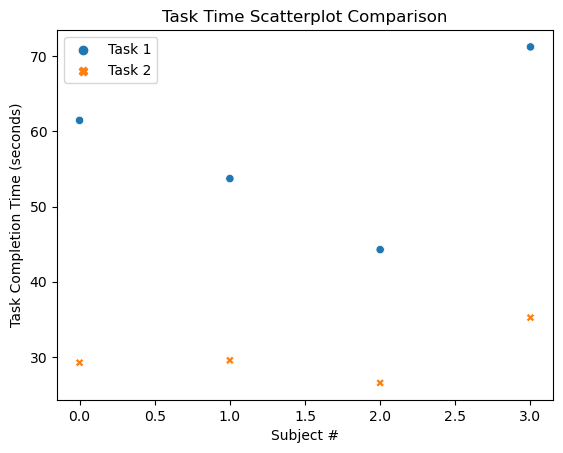

In [198]:
plt_data = df_mean.loc[:, ['Task t1', 'Task t2']]
plt_data.rename({'Task t1': 'Task 1', 'Task t2': 'Task 2'}, axis=1, inplace=True)
plot=sns.scatterplot(data=plt_data)
plot.set_title("Task Time Scatterplot Comparison")
plot.set_xlabel("Subject #")
plot.set_ylabel("Task Completion Time (seconds)")

## Show Group Task Time Distribution

Our data collected from our group specifically shows that Task 1 takes significantly longer time compared to Task 2. When compared to how our data looks and the overall class data, we can see that there is a similarity between the amount of time it takes for both Task 1 and Task 2.

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0, 0.5, 'Count')

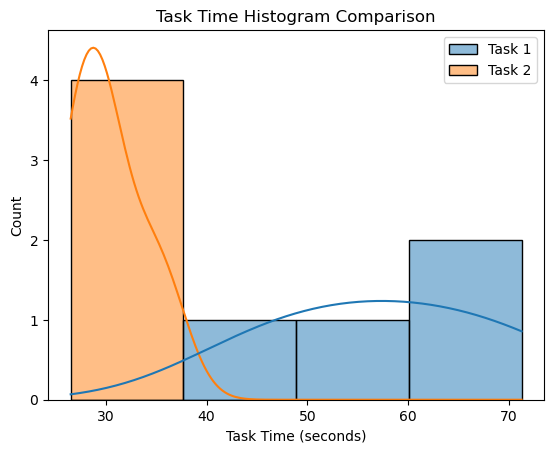

In [199]:
plot = sns.histplot(data=plt_data, kde = True) # Create task time histogram
plot.set_title("Task Time Histogram Comparison")
plot.set_xlabel("Task Time (seconds)")
plot.set_ylabel("Count")

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Task Time (seconds)')

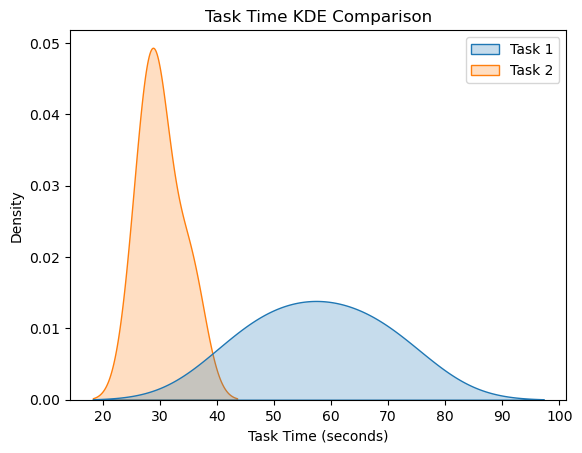

In [200]:
plot = sns.kdeplot(data=plt_data, fill=True) # # Create task time Kernal Desensity Estimation
plot.set_title("Task Time KDE Comparison")
plot.set_xlabel("Task Time (seconds)")

## Analyze & Visualize the Differences

The mean or average of our group’s task 1 timing came to be 57.67 seconds. For task 2 the mean time was almost halved at 30.13 seconds. We repeated the steps to calculate the standard deviation of each task within our group with Python code. Once we successfully incorporated the description data frame, we found the standard deviations to be 11.45 and 3.65 for each task respectively; our standard deviations correlated to those derived from the values of the entire class.

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Task Time (seconds)')

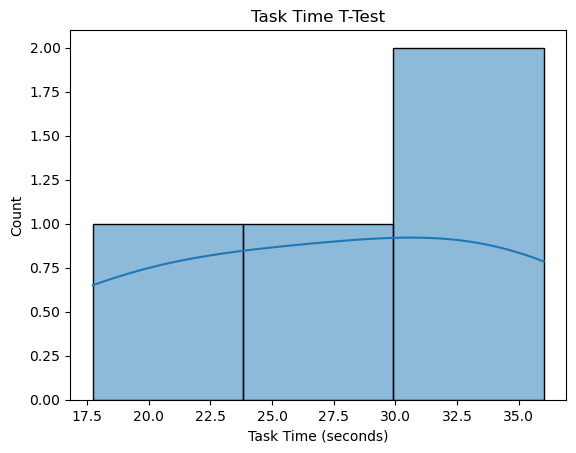

In [201]:
plt_data['Difference'] = plt_data['Task 1']- plt_data['Task 2']
plot=sns.histplot(data=plt_data['Difference'], kde = True) # Create task time difference histogram
plot.set_title("Task Time T-Test")
plot.set_xlabel("Task Time (seconds)")

## Calculate if the difference is statistically significant

We calculated the number of bins using the given equation 1+log2(n).[1] The total number of bins is 3. After finding the total number of bins, we were able to create histograms regarding the class task time for task 1 and task 2. In the histogram, we labeled the x-axis as the total number of bins and the y-axis as the frequency.

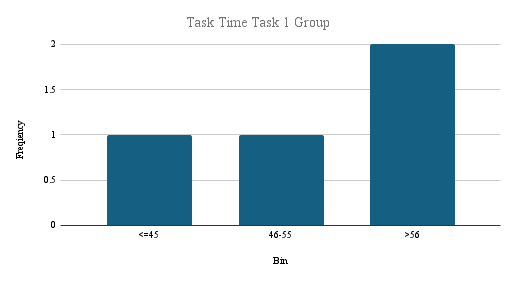

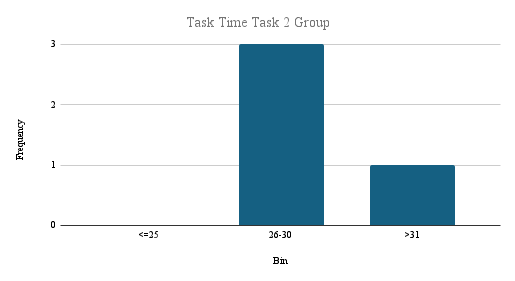

Using Excel, we found the max and min which for task 1 are 71.23 and 44.27 seconds respectively; for task 2 the respective max and min values are 35.22 and 26.54. Our values are much more of a confined data set in their ranges but show the same relative pattern as the compiled data of the class.

## References

[1] - Lab2_BinCalculations.xlsx 


Review in Mitosheet



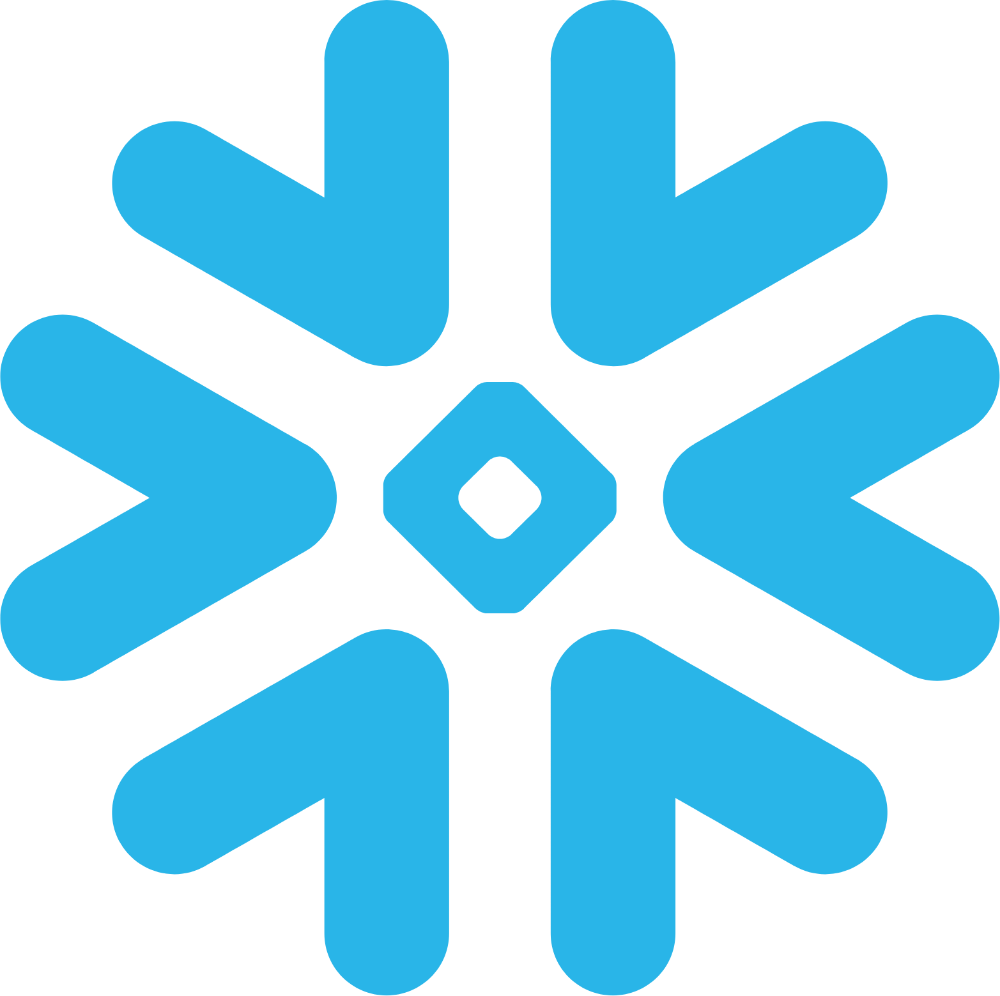

In [147]:
print("\nReview in Mitosheet")
mitosheet.sheet(plt_data, analysis_to_replay="id-zhiqbiiyho") # inspect null values in Mitosheet 

In [202]:
plt_data['Difference Squared'] = plt_data['Difference']**2

'''num = plt_data['Difference'].sum()
print("num:", num, "\n")
n = (plt_data.count())[0]
print("n: ", n, "\n")
sum_d_sq = (plt_data['Difference']**2).sum()
sum_sq = (plt_data['Difference']).sum()
sum_sq = sum_sq**2
div = (n * sum_d_sq - sum_sq) / (n-1)
t_value = num/div
print(t_value)'''

'num = plt_data[\'Difference\'].sum()\nprint("num:", num, "\n")\nn = (plt_data.count())[0]\nprint("n: ", n, "\n")\nsum_d_sq = (plt_data[\'Difference\']**2).sum()\nsum_sq = (plt_data[\'Difference\']).sum()\nsum_sq = sum_sq**2\ndiv = (n * sum_d_sq - sum_sq) / (n-1)\nt_value = num/div\nprint(t_value)'

Use scipy.stats library

In [203]:
result = stats.ttest_rel(plt_data['Task 1'], plt_data['Task 2'], alternative='greater')

#print(result)
print(f'Degrees of Fredom (dof = n-1): {result.df}')
print(f't statistic: {result.statistic:.3}')
print(f'pvalue: {result.pvalue:.3}')

Degrees of Fredom (dof = n-1): 3
t statistic: 6.72
pvalue: 0.00336


In this case, our significange level is 0.05. If p>0.05, we accept our null hypothesis. If p<0.05, we reject our hypothesis. Based on the data we collected and the values computed using both Python and Excel, we ** our hypothesis. Multitasking should be avoided.

# Group Task Errors

## Impute Values

In [204]:
df_drop = df.loc[:, ['Task e1', 'Task e2']]
df_drop.dropna(inplace=True)
print("Drop Values\n", df_drop.describe())
print("Missing Values\n",df_drop.isna().sum())
print(df_drop)

Drop Values
         Task e1  Task e2
count  4.000000  4.00000
mean   0.750000  0.50000
std    0.957427  0.57735
min    0.000000  0.00000
25%    0.000000  0.00000
50%    0.500000  0.50000
75%    1.250000  1.00000
max    2.000000  1.00000
Missing Values
 Task e1    0
Task e2    0
dtype: int64
   Task e1  Task e2
0        1        1
1        0        0
2        0        1
3        2        0


In [205]:
df_mean = df.loc[:, ['Task e1', 'Task e2']]
df_mean['Task e1'].fillna(df['Task e1'].mean(), inplace = True) #use column mean to fill missing data
df_mean['Task e2'].fillna(df['Task e2'].mean(), inplace = True) #use column mean to fill missing data
print("\nMean Values\n", df_mean.describe())
print("Missing Values\n", df_mean.isna().sum())
print(df_mean)


Mean Values
         Task e1  Task e2
count  4.000000  4.00000
mean   0.750000  0.50000
std    0.957427  0.57735
min    0.000000  0.00000
25%    0.000000  0.00000
50%    0.500000  0.50000
75%    1.250000  1.00000
max    2.000000  1.00000
Missing Values
 Task e1    0
Task e2    0
dtype: int64
   Task e1  Task e2
0        1        1
1        0        0
2        0        1
3        2        0


## Visualize Data

Text(0, 0.5, '# of Errors')

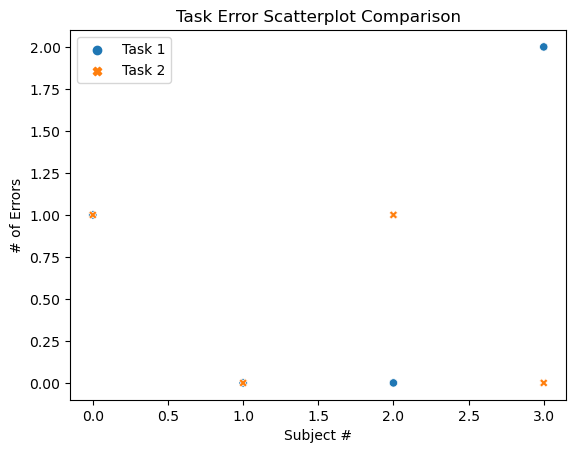

In [207]:
plt_data = df_mean.loc[:, ['Task e1', 'Task e2']]
plt_data.rename({'Task e1': 'Task 1', 'Task e2': 'Task 2'}, axis=1, inplace=True)
plot=sns.scatterplot(data=plt_data)
plot.set_title("Task Error Scatterplot Comparison")
plot.set_xlabel("Subject #")
plot.set_ylabel("# of Errors")

## Show Group Task Error Distribution

Based on our data, we can see that the amount of errors coorelates directly when compared to our overall class data. Task 1 seemed to have the more liekly chance of errors occuring while Task 2 had less likely due to the complexity of Task 1.

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0, 0.5, 'Count')

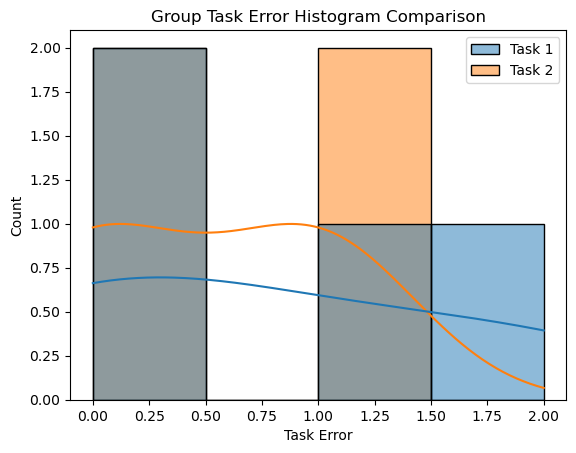

In [208]:
plot = sns.histplot(data=plt_data, kde = True) # Create task time histogram
plot.set_title("Group Task Error Histogram Comparison")
plot.set_xlabel("Task Error")
plot.set_ylabel("Count")

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Task Error')

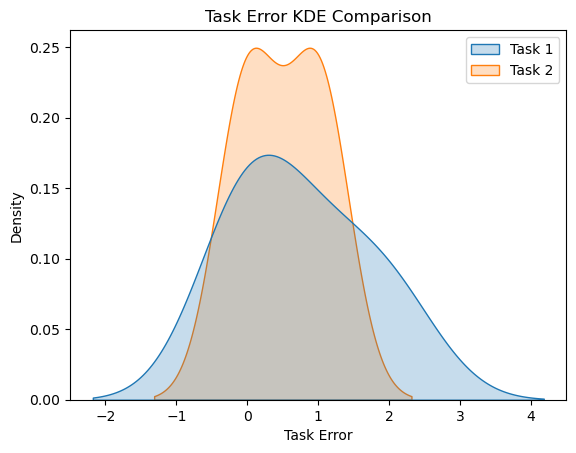

In [209]:
plot = sns.kdeplot(data=plt_data, fill=True) # # Create task time Kernal Desensity Estimation
plot.set_title("Task Error KDE Comparison")
plot.set_xlabel("Task Error")

## Analyze & Visualize the Differences

By using Excel, we can see that the t stat produced is “0.2“. This value is meant to compare two means. Through this, it may be confirmed that the previous information stated of multitaskers and people focused on one subject being vast in their difference is agreeable. Our count N is the number of samples logged, which is 4 values for our dataset. This is needed for calculations of t and p values. 

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Task Error')

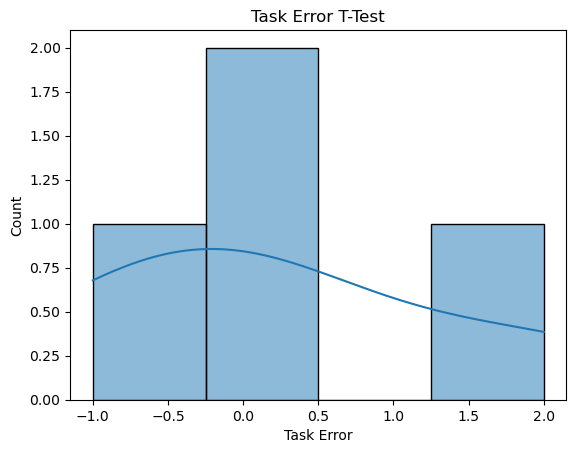

In [210]:
plt_data['Difference'] = plt_data['Task 1']- plt_data['Task 2']
plot=sns.histplot(data=plt_data['Difference'], kde = True) # Create task time difference histogram
plot.set_title("Task Error T-Test")
plot.set_xlabel("Task Error")

## Calculate if the difference is statistically significant

We calculated the number of bins using the given equation 1+log2(n).[1] The total number of bins is 3. After finding the total number of bins, we were able to create histograms regarding the class task time for task 1 and task 2. In the histogram, we labeled the x-axis as the total number of bins and the y-axis as the frequency.

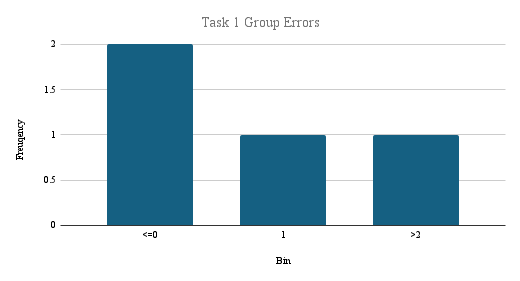

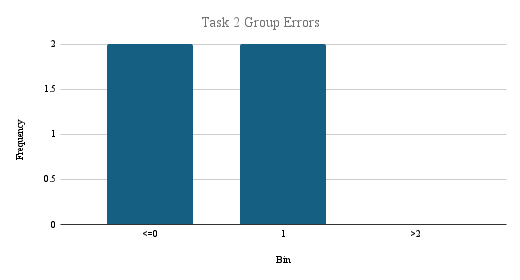

## References

[1] - Lab2_BinCalculations.xlsx 


Review in Mitosheet



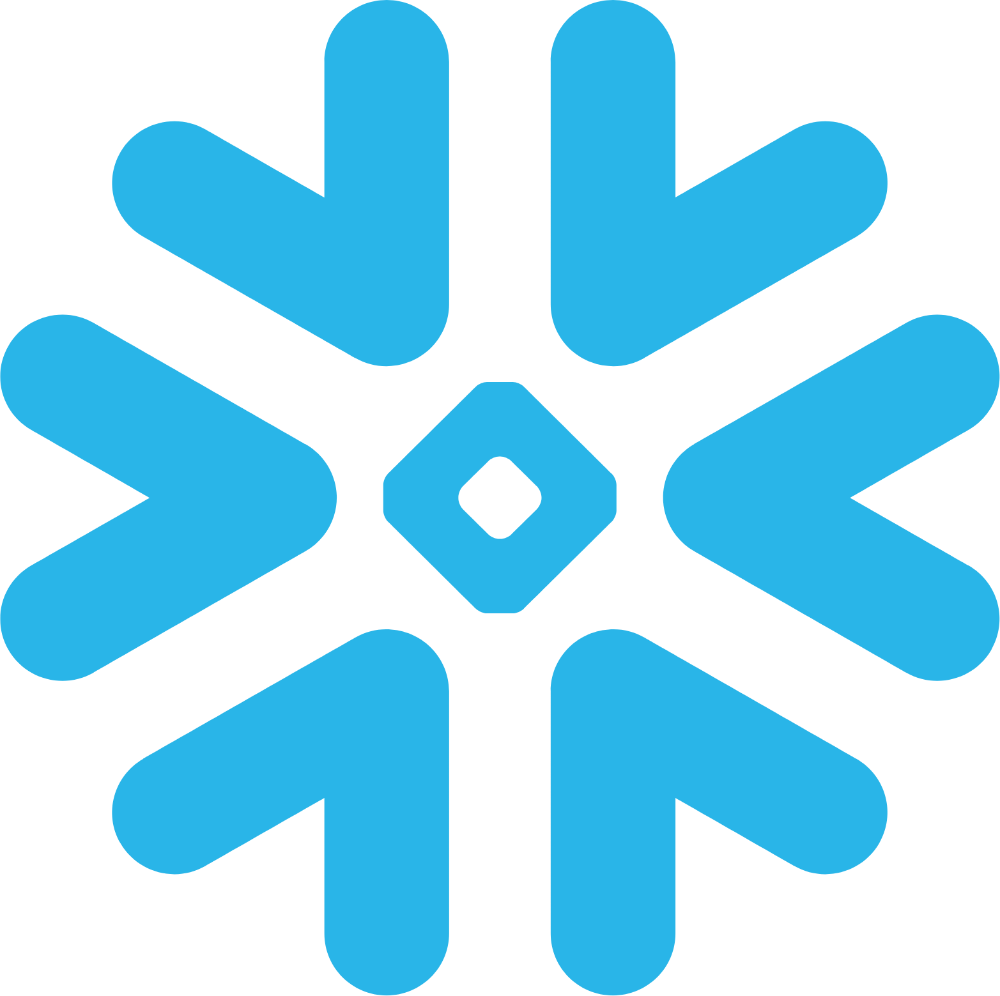

In [159]:
print("\nReview in Mitosheet")
mitosheet.sheet(plt_data, analysis_to_replay="id-zhiqbiiyho") # inspect null values in Mitosheet 

In [160]:
plt_data['Difference Squared'] = plt_data['Difference']**2

'''num = plt_data['Difference'].sum()
print("num:", num, "\n")
n = (plt_data.count())[0]
print("n: ", n, "\n")
sum_d_sq = (plt_data['Difference']**2).sum()
sum_sq = (plt_data['Difference']).sum()
sum_sq = sum_sq**2
div = (n * sum_d_sq - sum_sq) / (n-1)
t_value = num/div
print(t_value)'''

'num = plt_data[\'Difference\'].sum()\nprint("num:", num, "\n")\nn = (plt_data.count())[0]\nprint("n: ", n, "\n")\nsum_d_sq = (plt_data[\'Difference\']**2).sum()\nsum_sq = (plt_data[\'Difference\']).sum()\nsum_sq = sum_sq**2\ndiv = (n * sum_d_sq - sum_sq) / (n-1)\nt_value = num/div\nprint(t_value)'

Use scipy.stats library

In [162]:
result = stats.ttest_rel(plt_data['Task 1'], plt_data['Task 2'], alternative='greater')

#print(result)
print(f'Degrees of Fredom (dof = n-1): {result.df}')
print(f't statistic: {result.statistic:.3}')
print(f'pvalue: {result.pvalue:.3}')

Degrees of Fredom (dof = n-1): 3
t statistic: 0.397
pvalue: 0.359


In this case, our significange level is 0.05. If p>0.05, we accept our null hypothesis. If p<0.05, we reject our hypothesis. Based on the data we collected and the values computed using both Python and Excel, we ** our hypothesis. Multitasking should be avoided.

# Group Task Rating

## Impute Values

In [103]:
df_drop = df.loc[:, ['Task Ratings_1', 'Task Ratings_2']]
df_drop.dropna(inplace=True)
print("Drop Values\n", df_drop.describe())
print("Missing Values\n",df_drop.isna().sum())
print(df_drop)

Drop Values
        Task Ratings_1  Task Ratings_2
count            4.00        4.000000
mean             3.75        2.250000
std              0.50        0.957427
min              3.00        1.000000
25%              3.75        1.750000
50%              4.00        2.500000
75%              4.00        3.000000
max              4.00        3.000000
Missing Values
 Task Ratings_1    0
Task Ratings_2    0
dtype: int64
   Task Ratings_1  Task Ratings_2
0               4               3
1               3               1
2               4               2
3               4               3


In [104]:
df_mean = df.loc[:, ['Task Ratings_1', 'Task Ratings_2']]
df_mean['Task Ratings_1'].fillna(df['Task Ratings_1'].mean(), inplace = True) #use column mean to fill missing data
df_mean['Task Ratings_2'].fillna(df['Task Ratings_2'].mean(), inplace = True) #use column mean to fill missing data
print("\nMean Values\n", df_mean.describe())
print("Missing Values\n", df_mean.isna().sum())
print(df_mean)


Mean Values
        Task Ratings_1  Task Ratings_2
count            4.00        4.000000
mean             3.75        2.250000
std              0.50        0.957427
min              3.00        1.000000
25%              3.75        1.750000
50%              4.00        2.500000
75%              4.00        3.000000
max              4.00        3.000000
Missing Values
 Task Ratings_1    0
Task Ratings_2    0
dtype: int64
   Task Ratings_1  Task Ratings_2
0               4               3
1               3               1
2               4               2
3               4               3


## Visualize Data

Text(0, 0.5, 'Task Rating')

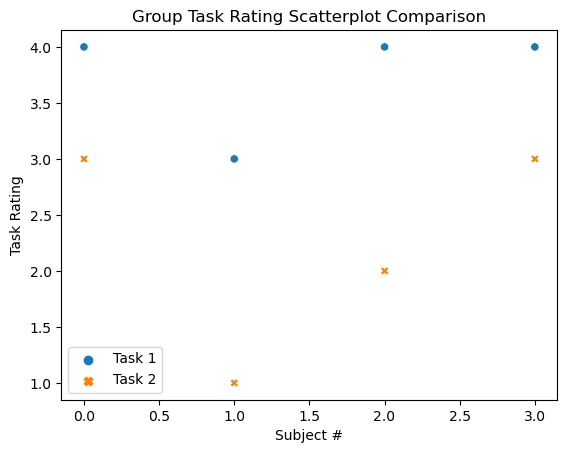

In [105]:
plt_data = df_mean.loc[:, ['Task Ratings_1', 'Task Ratings_2']]
plt_data.rename({'Task Ratings_1': 'Task 1', 'Task Ratings_2': 'Task 2'}, axis=1, inplace=True)
plot=sns.scatterplot(data=plt_data)
plot.set_title("Group Task Rating Scatterplot Comparison")
plot.set_xlabel("Subject #")
plot.set_ylabel("Task Rating")

## Show Group Task Rating Distribution 

Based on our data collected from our group, we can see in our histogram that Task 1 had more comments regarding its difficulty compared to Task 2. These values when compared to the overall class data, are similar.

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0, 0.5, 'Count')

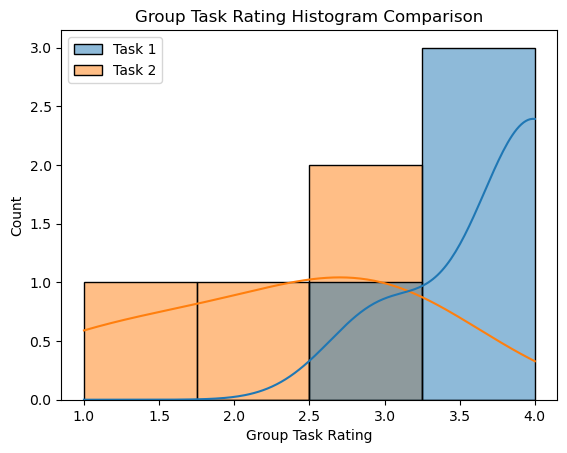

In [106]:
plot = sns.histplot(data=plt_data, kde = True) # Create task time histogram
plot.set_title("Group Task Rating Histogram Comparison")
plot.set_xlabel("Group Task Rating")
plot.set_ylabel("Count")

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Group Task Rating')

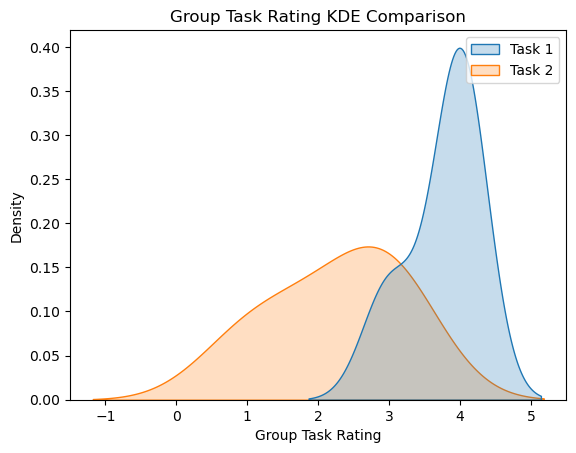

In [107]:
plot = sns.kdeplot(data=plt_data, fill=True) # # Create task time Kernal Desensity Estimation
plot.set_title("Group Task Rating KDE Comparison")
plot.set_xlabel("Group Task Rating")

## Analyze & Visualize the Differences

By using Excel, we can see that the t stat produced is “       “. This value is meant to compare two means. Through this, it may be confirmed that the previous information stated of multitaskers and people focused on one subject being vast in their difference is agreeable. Our count N is the number of samples logged, which is 4 values for our dataset. This is needed for calculations of t and p values. 

C:\Users\Kevin\anaconda3\envs\IE2250\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 0, 'Group Task Rating')

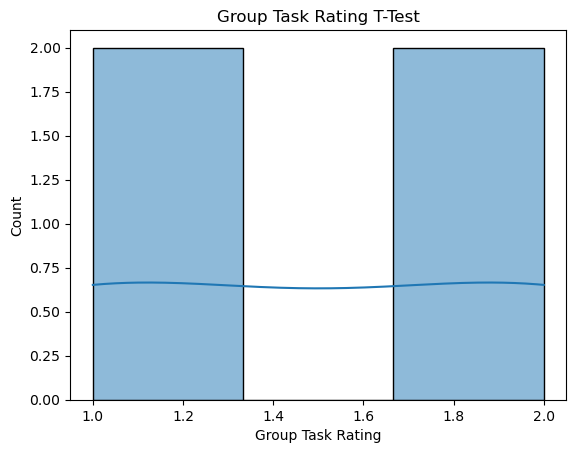

In [108]:
plt_data['Difference'] = plt_data['Task 1']- plt_data['Task 2']
plot=sns.histplot(data=plt_data['Difference'], kde = True) # Create task time difference histogram
plot.set_title("Group Task Rating T-Test")
plot.set_xlabel("Group Task Rating")

## Calculate if the Differences are Statistically Significant

We calculated the number of bins using the given equation 1+log2(n).[1] The total number of bins is 3. After finding the total number of bins, we were able to create histograms regarding the class task time for task 1 and task 2. In the histogram, we labeled the x-axis as the total number of bins and the y-axis as the frequency.

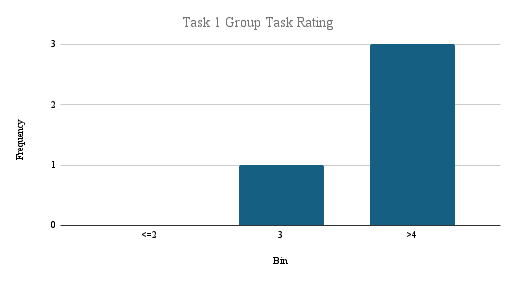

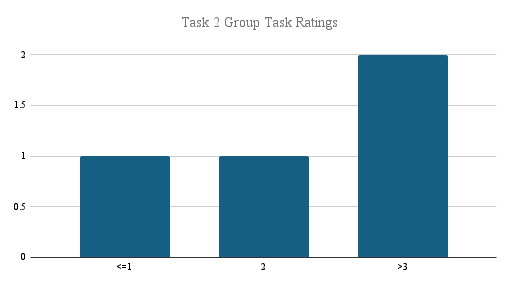

By using Excel, we can see that the t stat produced is “      “. This value is meant to compare two means. Through this, it may be confirmed that the previous information stated of multitaskers and people focused on one subject being vast in their difference is agreeable. As a result we would " (Accept or Reject) ".

## References

[1] - Lab2_BinCalculations.xlsx 


Review in Mitosheet



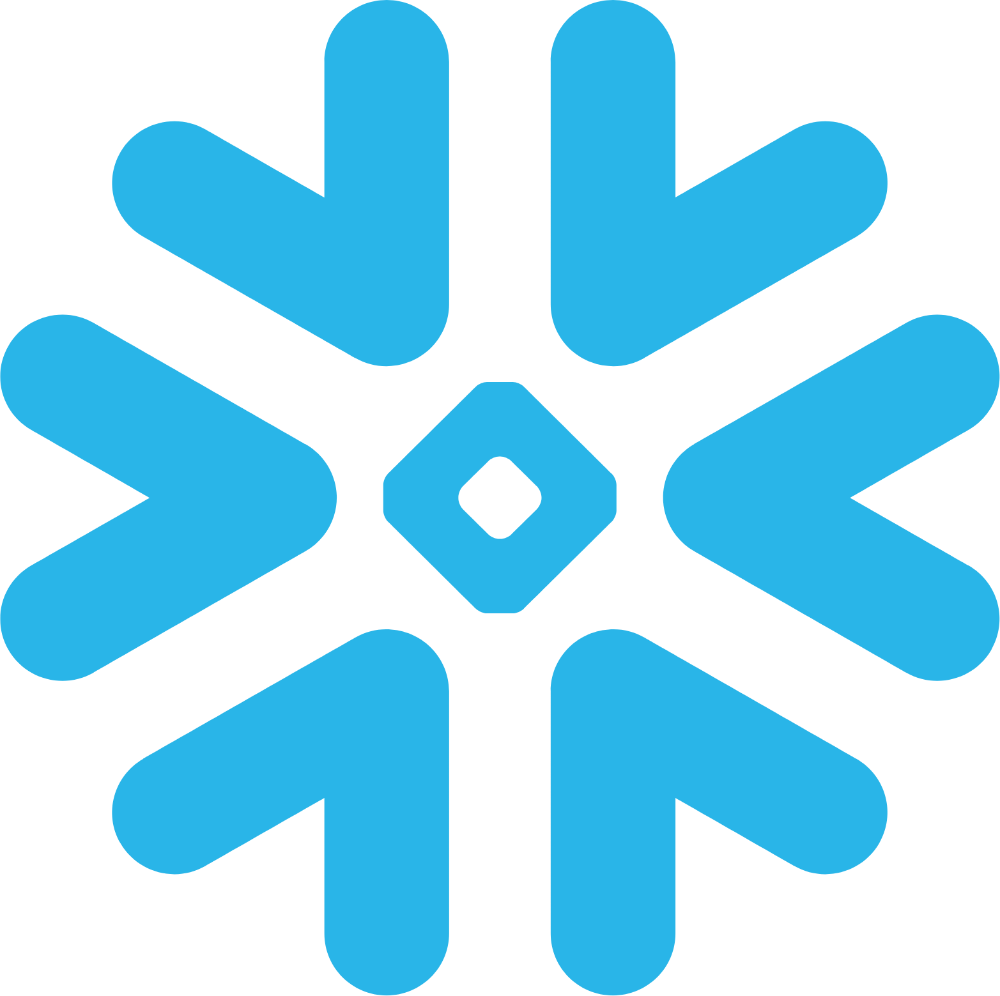

In [109]:
print("\nReview in Mitosheet")
mitosheet.sheet(plt_data, analysis_to_replay="id-zhiqbiiyho") # inspect null values in Mitosheet  

In [110]:
plt_data['Difference Squared'] = plt_data['Difference']**2

'''num = plt_data['Difference'].sum()
print("num:", num, "\n")
n = (plt_data.count())[0]
print("n: ", n, "\n")
sum_d_sq = (plt_data['Difference']**2).sum()
sum_sq = (plt_data['Difference']).sum()
sum_sq = sum_sq**2
div = (n * sum_d_sq - sum_sq) / (n-1)
t_value = num/div
print(t_value)'''

'num = plt_data[\'Difference\'].sum()\nprint("num:", num, "\n")\nn = (plt_data.count())[0]\nprint("n: ", n, "\n")\nsum_d_sq = (plt_data[\'Difference\']**2).sum()\nsum_sq = (plt_data[\'Difference\']).sum()\nsum_sq = sum_sq**2\ndiv = (n * sum_d_sq - sum_sq) / (n-1)\nt_value = num/div\nprint(t_value)'

Use scipy.stats library

In [111]:
result = stats.ttest_rel(plt_data['Task 1'], plt_data['Task 2'], alternative='greater')

#print(result)
print(f'Degrees of Fredom (dof = n-1): {result.df}')
print(f't statistic: {result.statistic:.3}')
print(f'pvalue: {result.pvalue:.3}')

Degrees of Fredom (dof = n-1): 3
t statistic: 5.2
pvalue: 0.00692


In this case, our significange level is 0.05. If p>0.05, we accept our null hypothesis. If p<0.05, we reject our hypothesis. Based on the data we collected and the values computed using both Python and Excel, we ** our hypothesis. Multitasking should be avoided.

# Conclusion

Overall, the class values are more applicable as they can be considered a more accurate look into humans who may or may not multitask as a whole. However, our group had a visible numerical similarity throughout the data analysis process. In turn, we accept the notion that multitasking should be avoided, as it is valueless and harmful for any process humans work on. Even a simple task like writing numbers and letters placed right in front of us was extended due to the chronological switching between two activities at once. The swiftness of task two and the error analysis that follows display such findings.